In [3]:
import numpy as np
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor, DecisionTreeClassifier, plot_tree
from sklearn.metrics import mean_absolute_error, mean_squared_error, accuracy_score

# Setting params for matplotlib figures
plt.rcParams.update({"figure.figsize": (6, 6),
                      "axes.facecolor": "white",
                      "axes.edgecolor": "black"})

plt.rcParams['axes.prop_cycle'] = plt.cycler(color=sb.color_palette('colorblind'))
font = {'family': 'sans-serif',
         'weight': 'normal',
         'size': 14}
plt.rc('font', **font)

file_path = 'Synthetic_ICU_Dataset_CGPT.csv'
df = pd.read_csv(file_path)
df = df.drop(columns=['Patient_ID'])
# file_path = '/content/synthetic_icu_dataset.csv'
# df = pd.read_csv(file_path)
# df = df.drop(columns=['Patient_ID'])

# file_path = '/content/synthetic_icu_dataset.csv'
# df = pd.read_csv(file_path)

df.head()

print(df.info())
print(df.describe())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10423 entries, 0 to 10422
Data columns (total 26 columns):
 #   Column                     Non-Null Count  Dtype 
---  ------                     --------------  ----- 
 0   Admission Hospital         10423 non-null  object
 1   Admission Unit             10423 non-null  object
 2   Admission Date             10423 non-null  object
 3   Admission Decision Time    10423 non-null  object
 4   Admission Time             10423 non-null  object
 5   Discharge Date             10423 non-null  object
 6   Survived                   10423 non-null  int64 
 7   Diagnosis                  10423 non-null  object
 8   Length of Stay             10423 non-null  int64 
 9   Cardiovascular Support     10423 non-null  int64 
 10  Dialysis Support           10423 non-null  int64 
 11  Invasive Ventilation       10423 non-null  int64 
 12  Nutrition                  10423 non-null  int64 
 13  Age                        10423 non-null  int64 
 14  Gender

In [4]:
# categorical_columns = ['Gender','Admission_Source','Primary_Diagnosis','Mortality', 'ICU_Discharge_Status']
categorical_columns = ['Admission Hospital', 'Admission Unit', 'Diagnosis', 'Gender']
for column in categorical_columns:
    df[column] = df[column].astype('category')

category_names = {col: df[col].cat.categories for col in categorical_columns}

# # Convert categorical columns to numeric codes
# df[categorical_columns] = df[categorical_columns].apply(lambda x: x.cat.codes)
# df = pd.get_dummies(df, columns=categorical_columns, drop_first=True)
df = pd.get_dummies(df, columns=categorical_columns, drop_first=False)

# Print the first few rows to check
print(df.head())


  Admission Date Admission Decision Time Admission Time Discharge Date  \
0     2022-07-19                   10:11          12:11     02/08/2022   
1     2022-08-22                   07:48          09:48     24/08/2022   
2     2022-01-26                   16:50          17:50     05/02/2022   
3     2022-02-11                   19:09          22:09     15/02/2022   
4     2022-03-02                   00:23          02:23     06/03/2022   

   Survived  Length of Stay  Cardiovascular Support  Dialysis Support  \
0         0              14                       1                 0   
1         1               2                       0                 0   
2         0              10                       1                 0   
3         1               4                       0                 0   
4         1               4                       0                 0   

   Invasive Ventilation  Nutrition  ...  Diagnosis_Sepsis  \
0                     0          1  ...             Fal

In [5]:
# Convert DOB and AdmissionDate since in dd/mm/yyyy
# df['DOB'] = pd.to_datetime(df['DOB'], format='%d/%m/%Y').view('int64') / 10**9
from datetime import datetime, timedelta
import pandas as pd

# Convert date columns
df['Admission Date'] = pd.to_datetime(df['Admission Date'], format='%Y-%m-%d')
df['Admission Decision Time'] = pd.to_datetime(df['Admission Decision Time'], format='%H:%M').dt.time
df['Admission Time'] = pd.to_datetime(df['Admission Time'], format='%H:%M').dt.time
df['Discharge Date'] = pd.to_datetime(df['Discharge Date'], format='%d/%m/%Y')

# df.set_index('Admission Date', inplace=True)

# # Extract time-based features for better modeling
# df['Admission Month'] = df.index.month
# df['Admission Day'] = df.index.day
# df['Admission Weekday'] = df.index.weekday
# df['Discharge Month'] = df['Discharge Date'].dt.month
# df['Discharge Weekday'] = df['Discharge Date'].dt.weekday

# Calculate wait time in hours
def calculate_wait_time(row):
    decision_datetime = datetime.combine(row['Admission Date'], row['Admission Decision Time'])
    admission_datetime = datetime.combine(row['Admission Date'], row['Admission Time'])

    if admission_datetime < decision_datetime:
        admission_datetime += timedelta(days=1)  # Correct midnight crossing issue

    return (admission_datetime - decision_datetime).total_seconds() / 3600

df['Wait Time (hrs)'] = df.apply(calculate_wait_time, axis=1)

# Extract month & season **before converting to numeric**
df['Month'] = df['Admission Date'].dt.month
season_mapping = {
    11: 'Winter', 12: 'Winter', 1: 'Winter',
    2: 'Spring', 3: 'Spring', 4: 'Spring',
    5: 'Summer', 6: 'Summer', 7: 'Summer',
    8: 'Autumn', 9: 'Autumn', 10: 'Autumn'
}

# Apply mapping
df['Season'] = df['Month'].map(season_mapping)
# Convert dates to UNIX timestamps (seconds)
# df['Admission Date'] = df['Admission Date'].view('int64') / 10**9
# df['Discharge Date'] = df['Discharge Date'].view('int64') / 10**9

df.to_csv('Synthetic_ICU_Dataset_CGPT2.csv', index=False)

# Print sample output
print(df[['Admission Date', 'Month', 'Season', 'Wait Time (hrs)']].head())

# df.set_index('Admission Date', inplace=True)

# catdf['season'] = pd.Categorical(catdf['season'], categories=season_order, ordered=True)

  Admission Date  Month  Season  Wait Time (hrs)
0     2022-07-19      7  Summer              2.0
1     2022-08-22      8  Autumn              2.0
2     2022-01-26      1  Winter              1.0
3     2022-02-11      2  Spring              3.0
4     2022-03-02      3  Spring              2.0


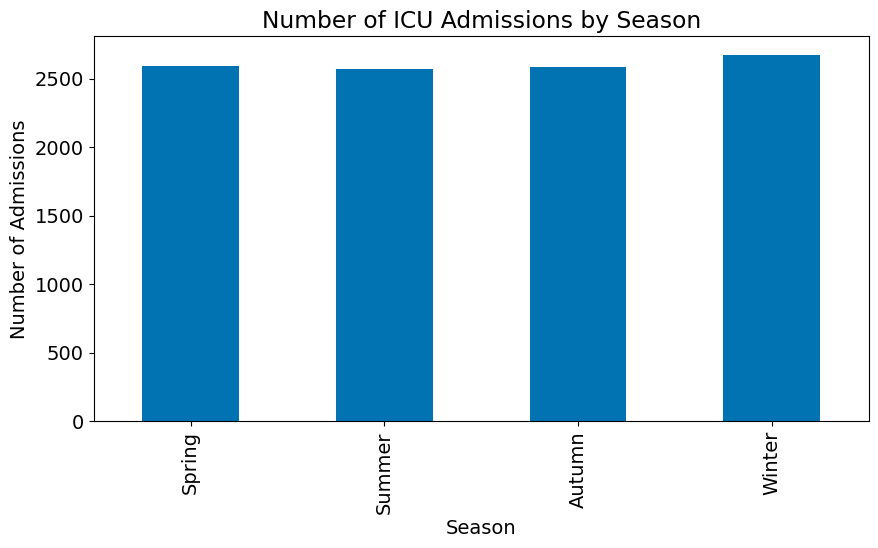

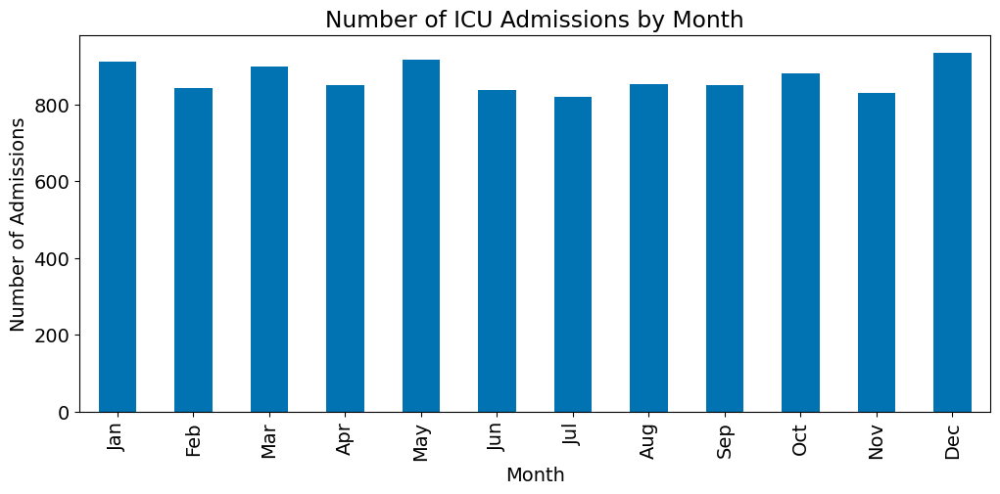

In [6]:
# # Tally entries by season
# season_tally = df['Season'].value_counts().sort_index()

# # Tally entries by month
# month_tally = df['Month'].value_counts().sort_index()

# # Plotting the tally by season
# plt.figure(figsize=(10, 5))
# season_tally.plot(kind='bar')
# plt.title('Number of ICU Admissions by Season')
# plt.xlabel('Season')
# plt.ylabel('Number of Admissions')
# plt.grid(False)
# plt.show()

# # Plotting the tally by month
# plt.figure(figsize=(10, 5))
# month_tally.plot(kind='bar')
# plt.title('Number of ICU Admissions by Month')
# plt.xlabel('Month')
# plt.ylabel('Number of Admissions')
# plt.grid(False)
# plt.show()

season_order = ['Spring', 'Summer', 'Autumn', 'Winter']
month_order = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

# Ensure 'Season' follows the correct order
df['Season'] = pd.Categorical(df['Season'], categories=season_order, ordered=True)
season_tally = df['Season'].value_counts().reindex(season_order)

# Ensure 'Month' follows the correct order (assuming month names are stored, otherwise map numbers to names)
month_mapping = {
    1: 'Jan', 2: 'Feb', 3: 'Mar', 4: 'Apr', 5: 'May', 6: 'Jun',
    7: 'Jul', 8: 'Aug', 9: 'Sep', 10: 'Oct', 11: 'Nov', 12: 'Dec'
}
df['Month Name'] = df['Month'].map(month_mapping)  # Convert numbers to names if needed
df['Month Name'] = pd.Categorical(df['Month Name'], categories=month_order, ordered=True)
month_tally = df['Month Name'].value_counts().reindex(month_order)

# Plotting the tally by season
plt.figure(figsize=(10, 5))
season_tally.plot(kind='bar')
plt.title('Number of ICU Admissions by Season')
plt.xlabel('Season')
plt.ylabel('Number of Admissions')
plt.grid(False)
plt.show()

# Plotting the tally by month
plt.figure(figsize=(12, 5))
month_tally.plot(kind='bar')
plt.title('Number of ICU Admissions by Month')
plt.xlabel('Month')
plt.ylabel('Number of Admissions')
plt.grid(False)
plt.show()

C:\Users\steve\AppData\Local\Temp\ipykernel_2312\3722018910.py:7: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  df['Gender_Label'] = df[['Gender_Male']].apply(lambda x: 'Male' if x[0] == 1 else 'Female', axis=1)


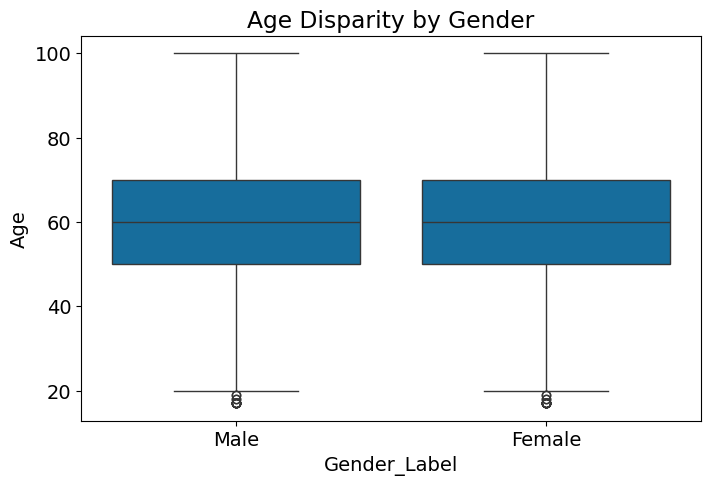

Gender_Label
Male      6211
Female    4212
Name: count, dtype: int64

In [7]:
# plt.figure(figsize=(8, 5))
# sb.boxplot(x=df['Gender'], y=df['Age'])
# plt.title("Age Disparity by Gender")
# plt.show()
# df['Gender'].value_counts()

df['Gender_Label'] = df[['Gender_Male']].apply(lambda x: 'Male' if x[0] == 1 else 'Female', axis=1)

plt.figure(figsize=(8, 5)) 
sb.boxplot(x=df['Gender_Label'], y=df['Age'])
plt.title("Age Disparity by Gender")
plt.show()

df['Gender_Label'].value_counts()


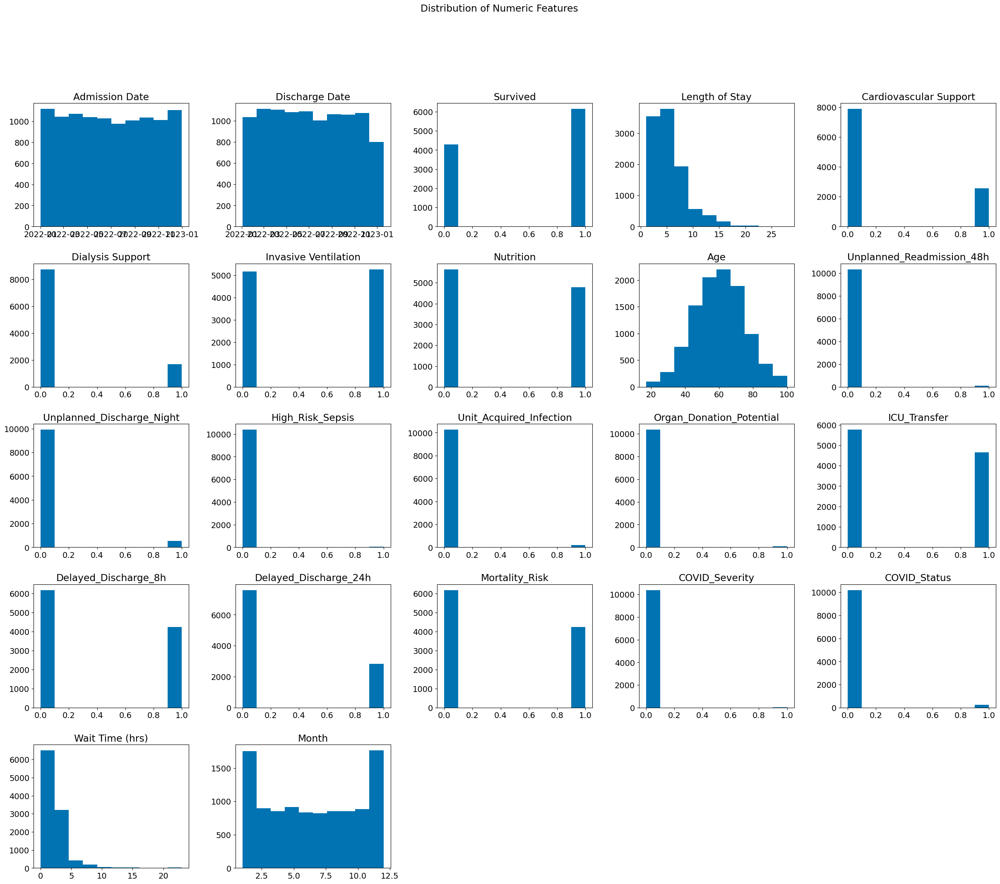

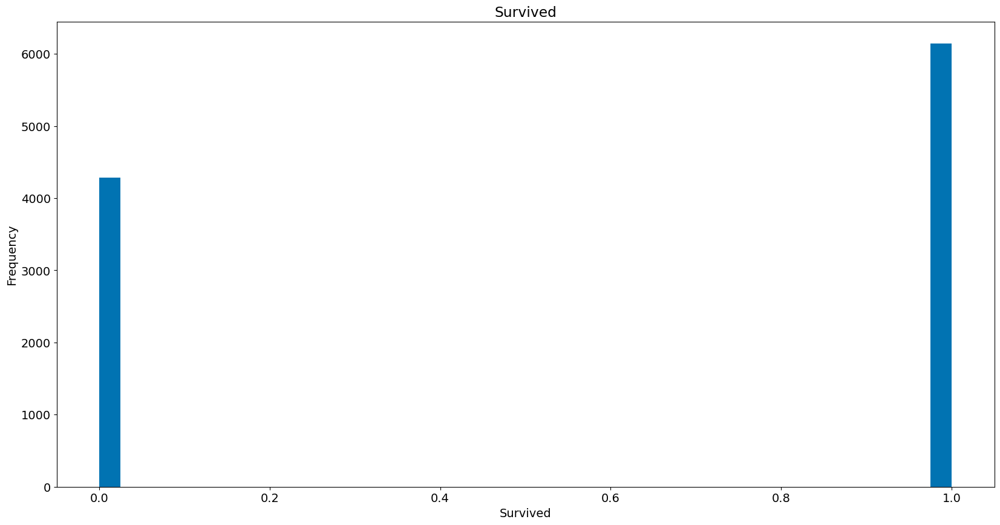

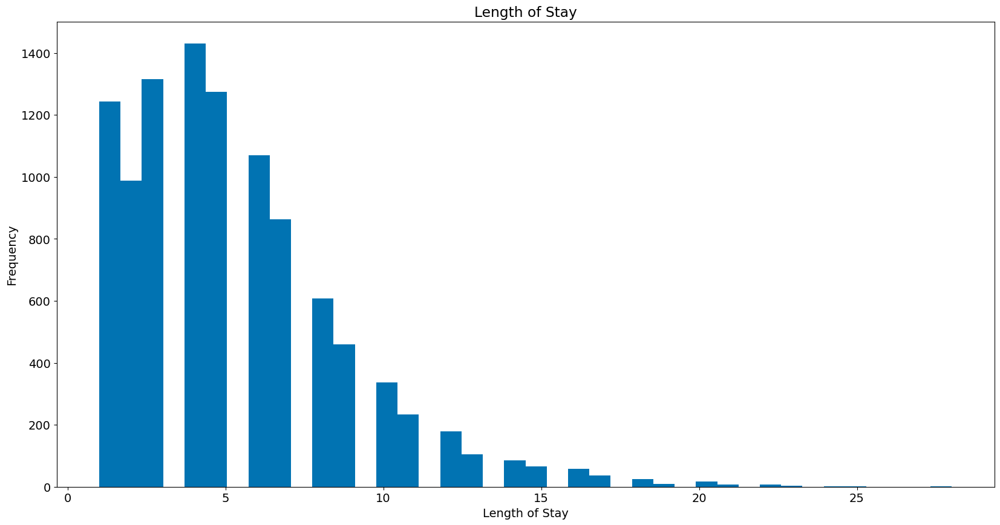

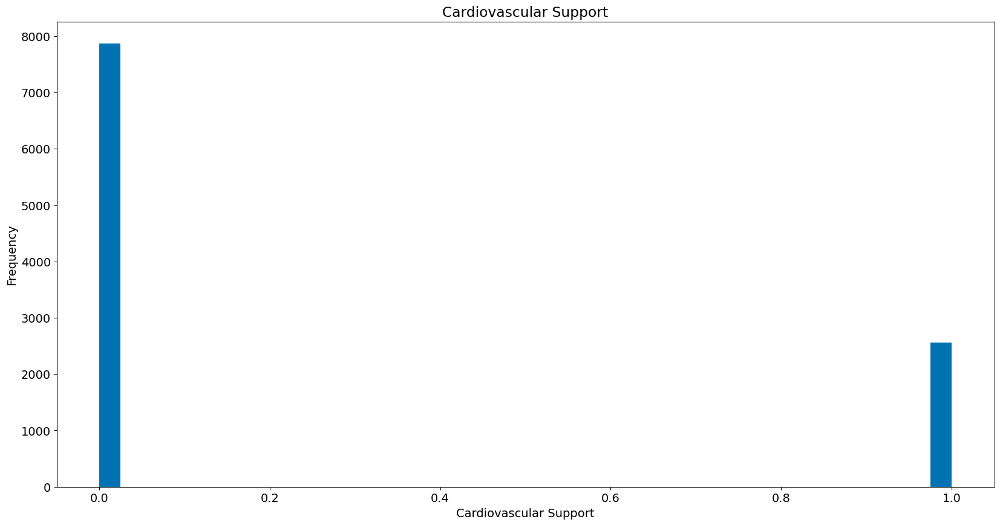

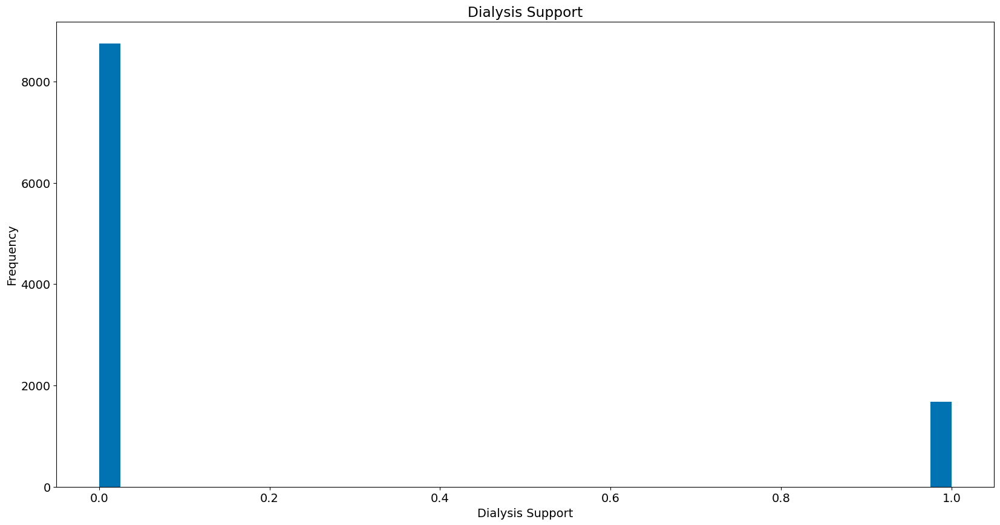

...

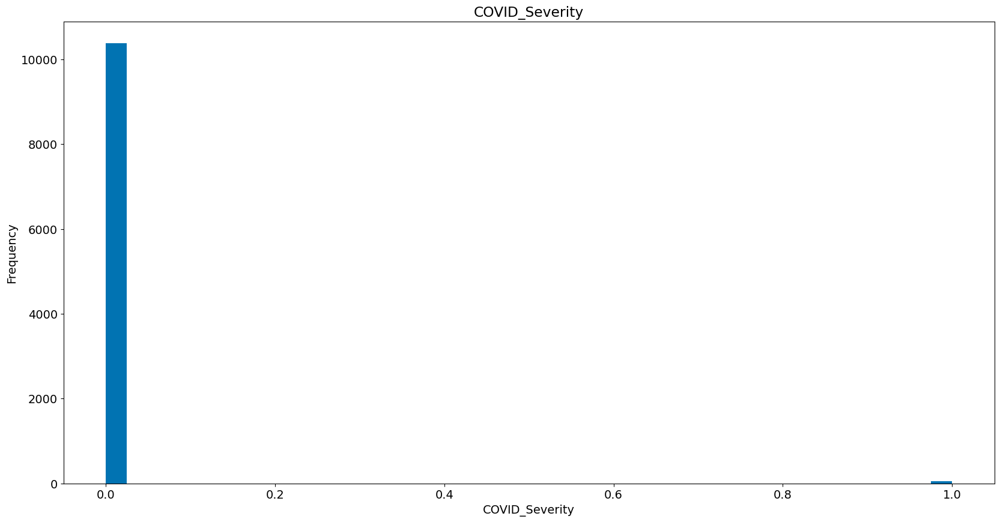

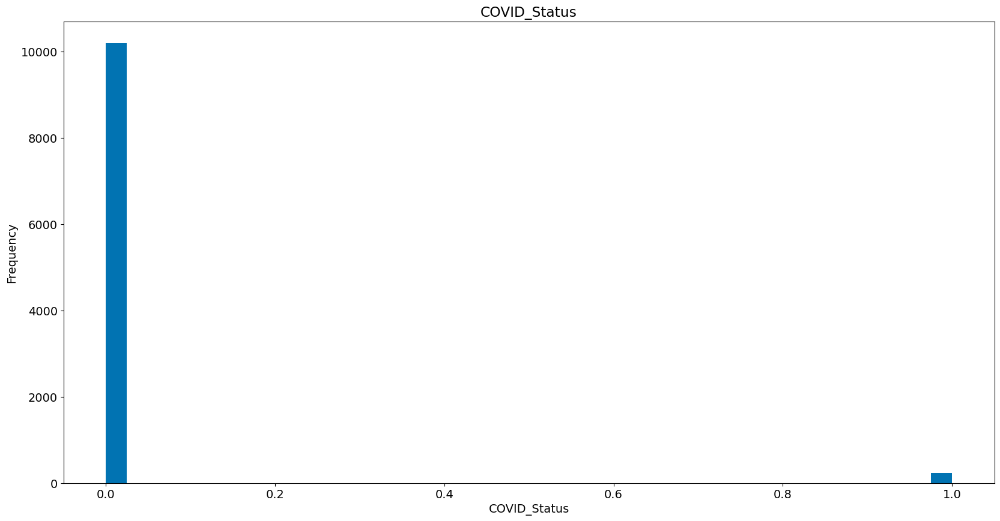

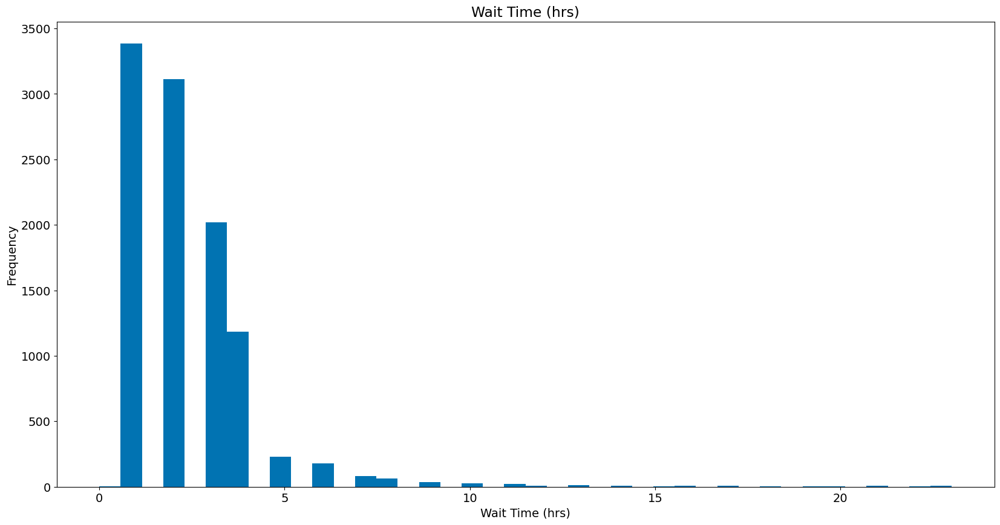

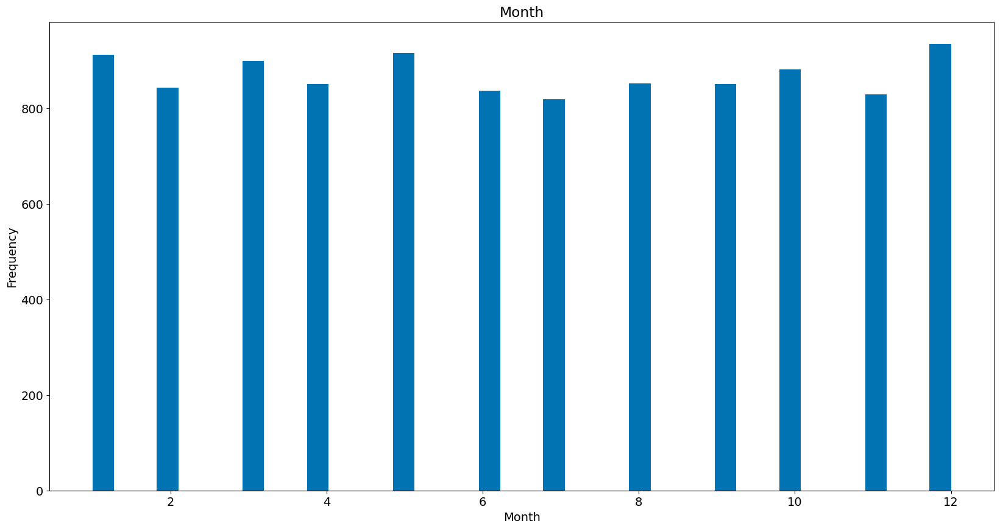

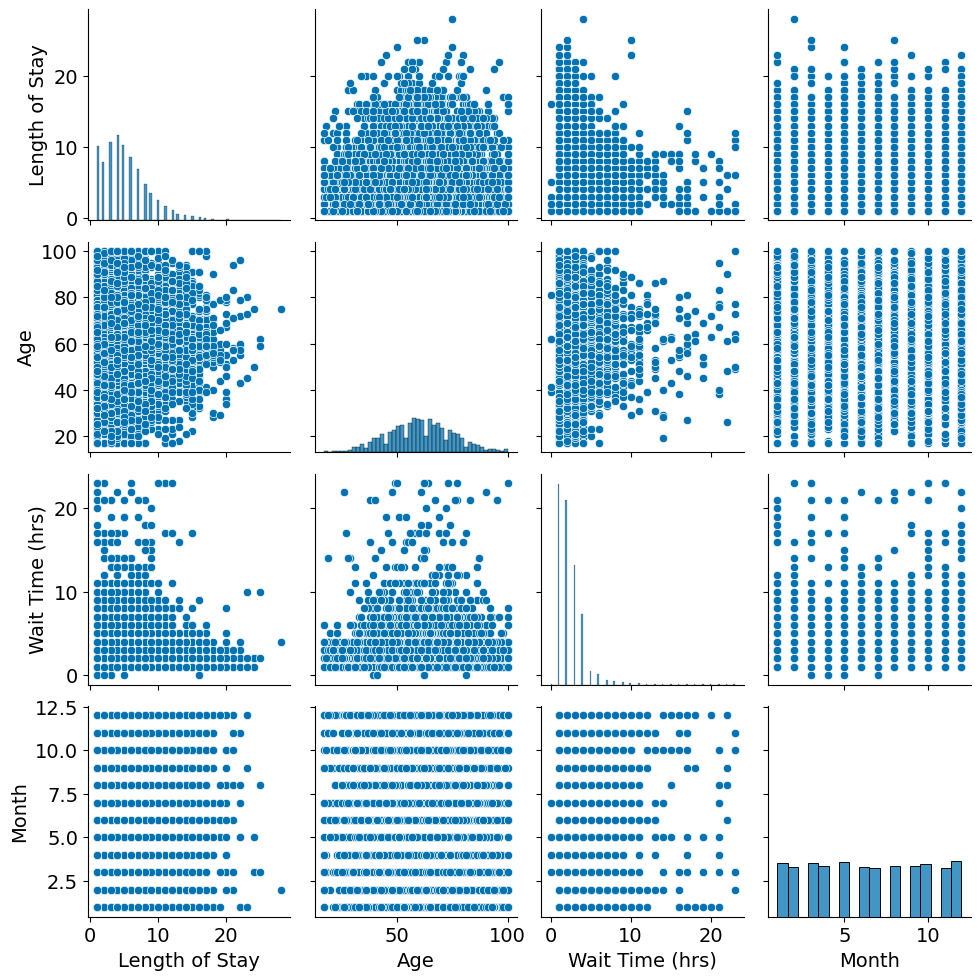

In [8]:
df.hist(figsize=(30, 24), grid = False)
plt.suptitle("Distribution of Numeric Features")
plt.show()

numerical_columns = df.select_dtypes(include=[np.number]).columns
for col in numerical_columns:
    plt.figure(figsize=(20, 10))
    df[col].hist(bins=40)
    plt.title(f'{col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.grid(False)
    plt.show()

numerical_columns = [col for col in numerical_columns if df[col].nunique() > 2]
sb.pairplot(df[numerical_columns])
plt.show()

# sampled_df = df.sample(n=1000, random_state=42)
# sb.pairplot(sampled_df)
# plt.show()

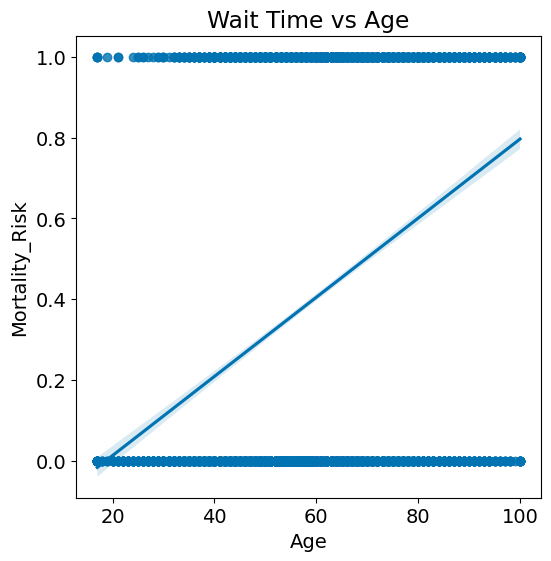

In [9]:
sb.regplot(data=df, x='Age', y='Mortality_Risk')
plt.title("Wait Time vs Age")
plt.show()

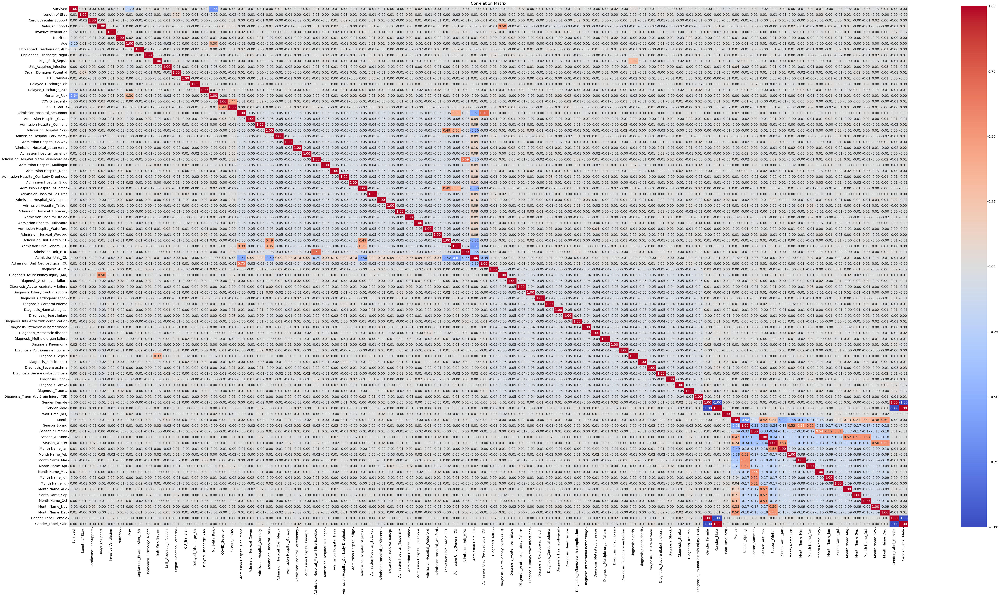

In [ ]:
plt.figure(figsize=(80, 40))

heatmap_data = df.copy()
heatmap_data = heatmap_data.drop(columns=['Admission Date','Admission Decision Time','Admission Time','Discharge Date'])

heatmap_data_encoded = pd.get_dummies(heatmap_data)

sb.heatmap(heatmap_data_encoded.corr(), annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Correlation Matrix")
plt.show()

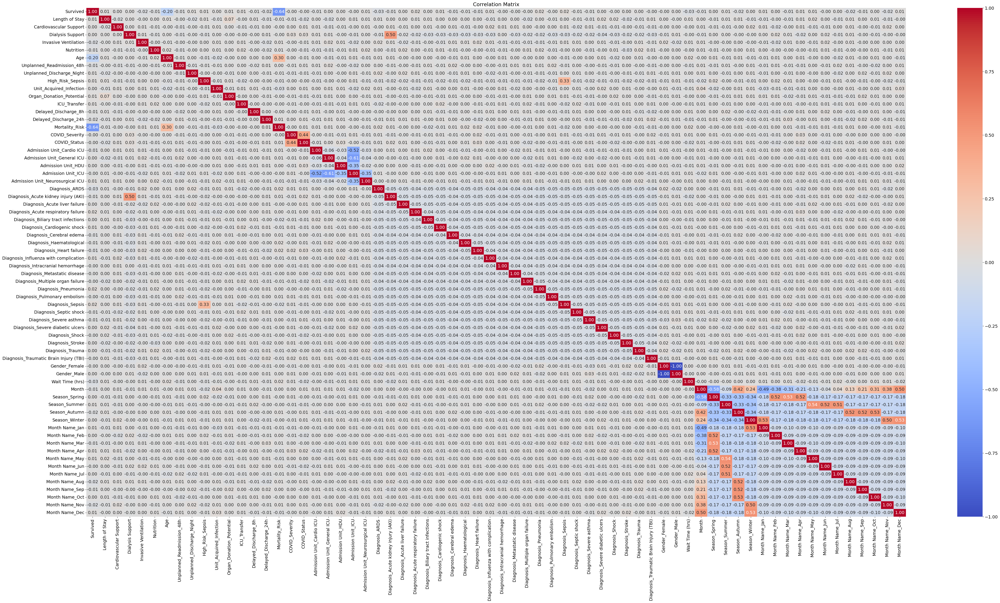

In [20]:
plt.figure(figsize=(60, 30))

heatmap_data = df.copy()

heatmap_data = heatmap_data.drop(columns=[
    'Admission Date', 
    'Admission Decision Time', 
    'Admission Time', 
    'Discharge Date',
    'Gender_Label'
])

heatmap_data_encoded = pd.get_dummies(heatmap_data)

admission_hospital_cols = [col for col in heatmap_data_encoded.columns if col.startswith('Admission Hospital_')]
heatmap_data_encoded = heatmap_data_encoded.drop(columns=admission_hospital_cols)

sb.heatmap(heatmap_data_encoded.corr(), annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Correlation Matrix")
plt.show()


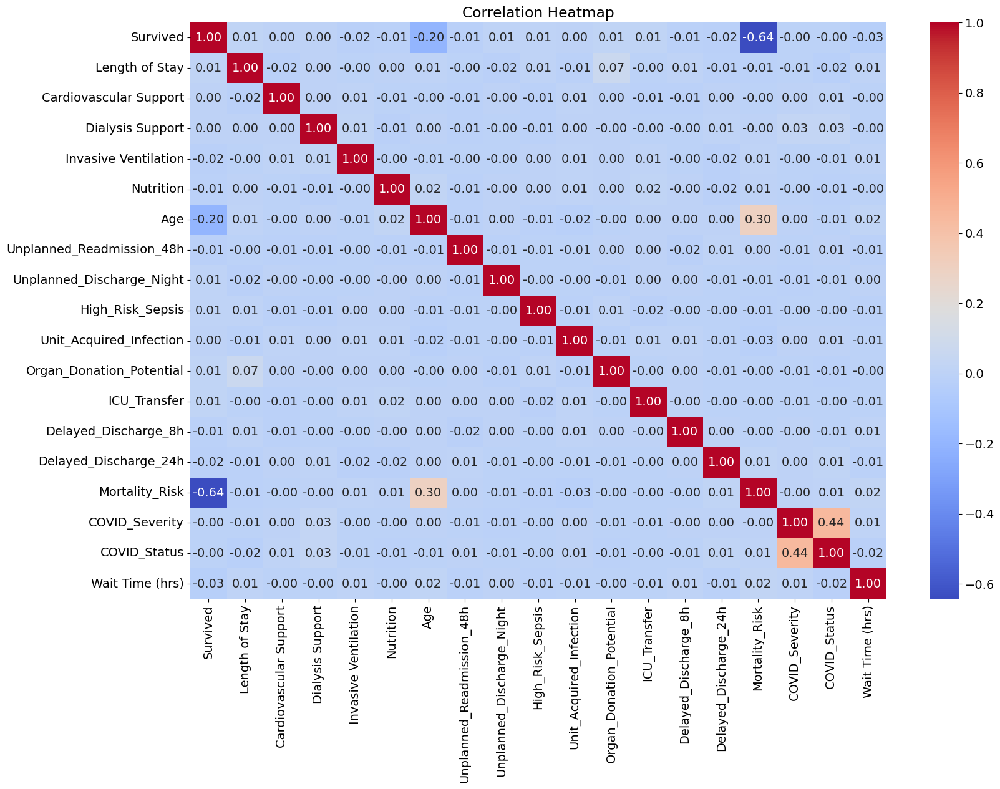

In [10]:
import seaborn as sb
import matplotlib.pyplot as plt

numeric_df = heatmap_data_encoded.select_dtypes(include=['int64', 'float64'])

exclude_features = ['Admission Hospital_Beaumont','Admission Hospital_Cavan','Admission Hospital_Connolly','Admission Hospital_Cork','Admission Hospital_Cork Mercy','Admission Hospital_Galway','Admission Hospital_Letterkenny','Admission Hospital_Limerick','Admission Hospital_Mater Misericordiae','Admission Hospital_Mullingar','Admission Hospital_Naas','Admission Hospital_Our Lady Drogheda','Admission Hospital_Sligo','Admission Hospital_St James','Admission Hospital_St Lukes','Admission Hospital_St Vincents','Admission Hospital_Tallagh','Admission Hospital_Tipperary','Admission Hospital_Tralee','Admission Hospital_Tullamore','Admission Hospital_Waterford','Admission Hospital_Wexford']

filtered_df = numeric_df.drop(columns=exclude_features, errors='ignore')

plt.figure(figsize=(18, 12))
sb.heatmap(filtered_df.corr(), annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Correlation Heatmap")
plt.show()


In [11]:
# plt.figure(figsize=(60, 20))
# heatmap_data = df.copy()
# heatmap_data = heatmap_data.drop(columns=['Admission Hospital','Admission Date','Admission Decision Time','Admission Time','Discharge Date'])
# for col, categories in category_names.items():
#     heatmap_data[col] = heatmap_data[col].apply(lambda x: categories[x])
# heatmap_data_encoded = pd.get_dummies(heatmap_data)
# sb.heatmap(heatmap_data_encoded.corr(), annot=True, cmap="coolwarm", fmt=".2f")
# plt.title("Correlation Matrix")
# plt.show()

In [12]:
# Drop Outcome
# X_outcome = df.drop(columns=['Sepsis'])
# selected_columns = ["Gender_Male", "Gender_Female", "Age","Mortality_Risk"]
selected_columns = ["Gender_Male", "Age","Mortality_Risk"]
X_outcome = df[selected_columns]
y_outcome = df['Diagnosis_Sepsis']

# Training and testing
X_outcome_train, X_outcome_test, y_outcome_train, y_outcome_test = train_test_split(X_outcome, y_outcome, test_size=0.2)

# Train the Decision Tree Regressor for Outcome
outcome_regressor = DecisionTreeRegressor()
outcome_regressor.fit(X_outcome_train, y_outcome_train)

# Predict Outcome using Regressor
y_outcome_pred = outcome_regressor.predict(X_outcome_test)

# Evaluate the Outcome Regressor model
mae_outcome_regressor = mean_absolute_error(y_outcome_test, y_outcome_pred)
mse_outcome_regressor = mean_squared_error(y_outcome_test, y_outcome_pred)
print(f"Outcome Regressor - MAE: {mae_outcome_regressor}, MSE: {mse_outcome_regressor}")

Outcome Regressor - MAE: 0.08704705580754957, MSE: 0.04719507556545137


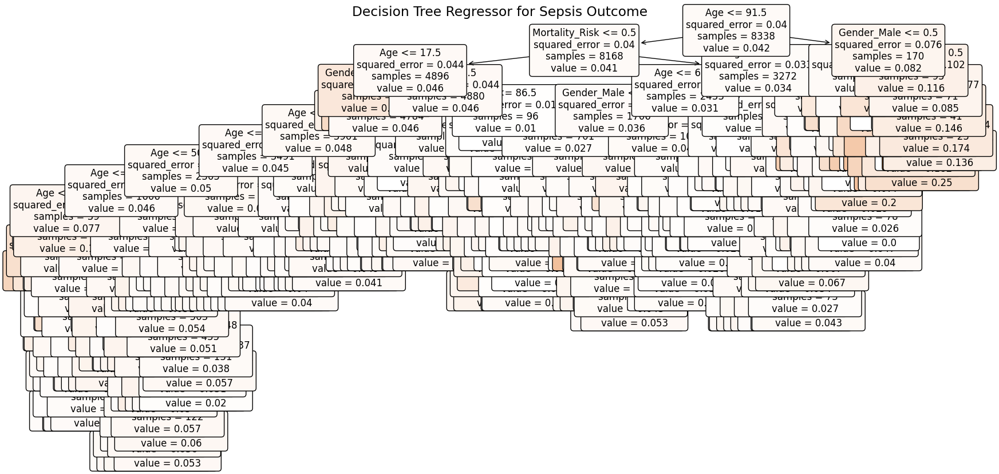

In [13]:
plt.figure(figsize=(20, 10))
plot_tree(outcome_regressor,
          feature_names=selected_columns,
          filled=True,
          rounded=True,
          fontsize=12)
plt.title("Decision Tree Regressor for Sepsis Outcome")
plt.show()

Outcome Regressor - MAE: 0.0846, MSE: 0.0437


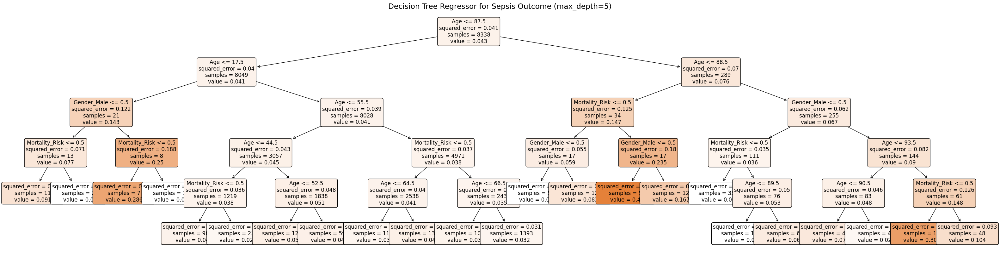

In [14]:
selected_columns = ["Gender_Male", "Age", "Mortality_Risk"]
X_outcome = df[selected_columns]
y_outcome = df['Diagnosis_Sepsis']

X_outcome_train, X_outcome_test, y_outcome_train, y_outcome_test = train_test_split(
    X_outcome, y_outcome, test_size=0.2, random_state=42
)

outcome_regressor = DecisionTreeRegressor(max_depth=5, random_state=42)
outcome_regressor.fit(X_outcome_train, y_outcome_train)

y_outcome_pred = outcome_regressor.predict(X_outcome_test)

mae_outcome_regressor = mean_absolute_error(y_outcome_test, y_outcome_pred)
mse_outcome_regressor = mean_squared_error(y_outcome_test, y_outcome_pred)
print(f"Outcome Regressor - MAE: {mae_outcome_regressor:.4f}, MSE: {mse_outcome_regressor:.4f}")

plt.figure(figsize=(40, 10))
plot_tree(outcome_regressor,
          feature_names=selected_columns,
          filled=True,
          rounded=True,
          fontsize=12)
plt.title("Decision Tree Regressor for Sepsis Outcome (max_depth=5)")
plt.show()

In [15]:
# Drop Outcome
# X_outcome = df.drop(columns=['Sepsis'])
selected_columns = ["Gender_Male","Age","Mortality_Risk"]
X_outcome = df[selected_columns]
y_outcome = df['Survived']

X_outcome_train, X_outcome_test, y_outcome_train, y_outcome_test = train_test_split(X_outcome, y_outcome, test_size=0.2)

outcome_classifier = DecisionTreeClassifier()
outcome_classifier.fit(X_outcome_train, y_outcome_train)

y_outcome_pred_classifier = outcome_classifier.predict(X_outcome_test)

accuracy_outcome_classifier = accuracy_score(y_outcome_test, y_outcome_pred_classifier)
print(f"Outcome Classifier - Accuracy: {accuracy_outcome_classifier}")

Outcome Classifier - Accuracy: 0.8254196642685852


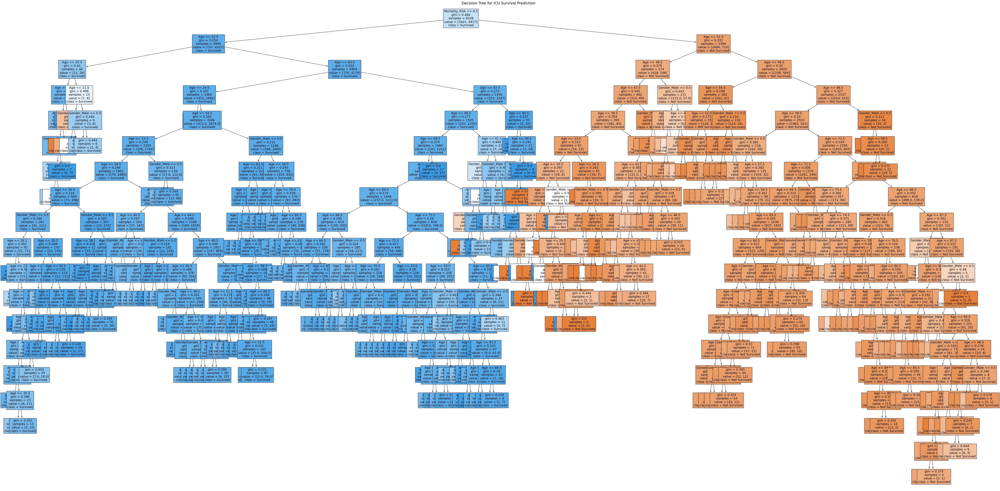

In [16]:
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree

# Plot the Decision Tree
plt.figure(figsize=(80, 40))
plot_tree(outcome_classifier, feature_names=X_outcome.columns, class_names=['Not Survived', 'Survived'], filled=True, fontsize= 14)
plt.title("Decision Tree for ICU Survival Prediction")
plt.show()

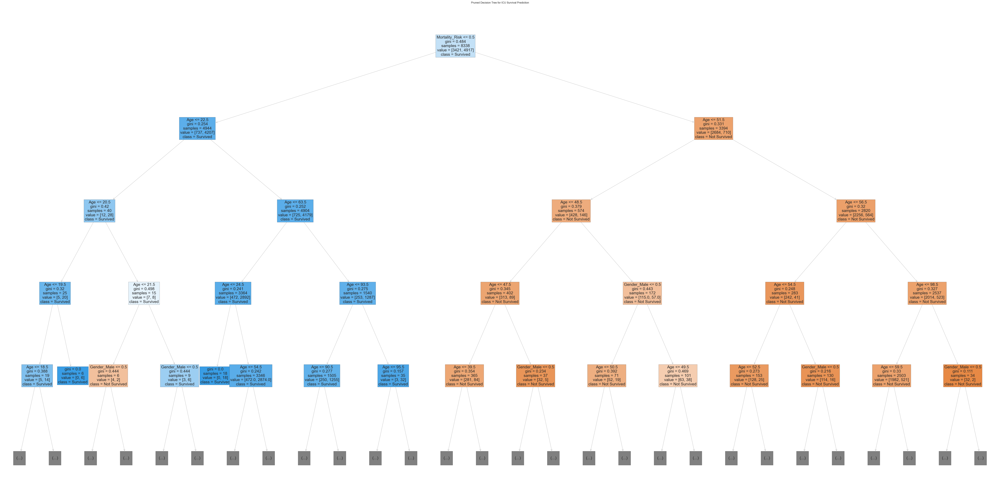

In [ ]:
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree

plt.figure(figsize=(80, 40))  
plot_tree(
    outcome_classifier,
    feature_names=X_outcome.columns,
    class_names=['Not Survived', 'Survived'],
    filled=True,
    fontsize=18,
    max_depth=4
)
plt.title("Pruned Decision Tree for ICU Survival Prediction")
plt.show()


In [18]:
# from sklearn.tree import export_graphviz
# from graphviz import Source
# import os

# export_graphviz(
#     outcome_classifier,
#     out_file="icu_tree.dot",
#     feature_names=X_outcome.columns,
#     class_names=["Not Survived", "Survived"],
#     filled=True,
#     rounded=True,
#     special_characters=True
# )

# from graphviz import render
# render('dot', 'pdf', 'icu_tree.dot')
# print("Saved as icu_tree.dot.pdf")


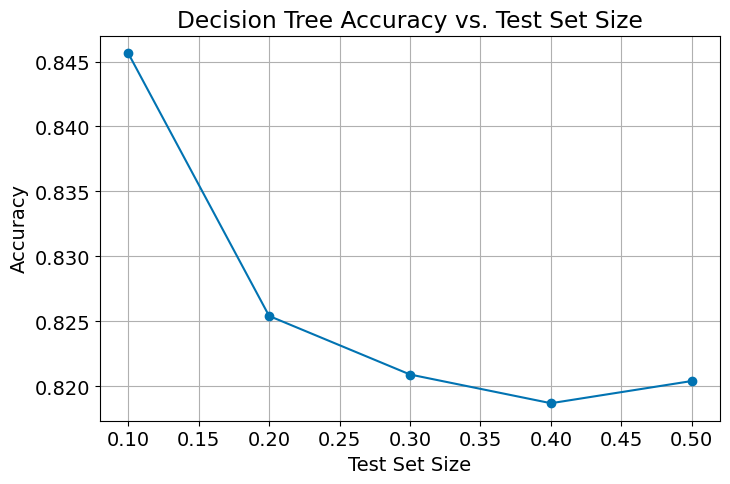

In [19]:
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# Different test sizes
test_sizes = np.linspace(0.1, 0.5, 5)
accuracies = []

for test_size in test_sizes:
    X_train, X_test, y_train, y_test = train_test_split(X_outcome, y_outcome, test_size=test_size, random_state=42)
    model = DecisionTreeClassifier()
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    accuracies.append(accuracy_score(y_test, y_pred))

plt.figure(figsize=(8, 5))
plt.plot(test_sizes, accuracies, marker='o', linestyle='-')
plt.xlabel("Test Set Size")
plt.ylabel("Accuracy")
plt.title("Decision Tree Accuracy vs. Test Set Size")
plt.grid(True)
plt.show()


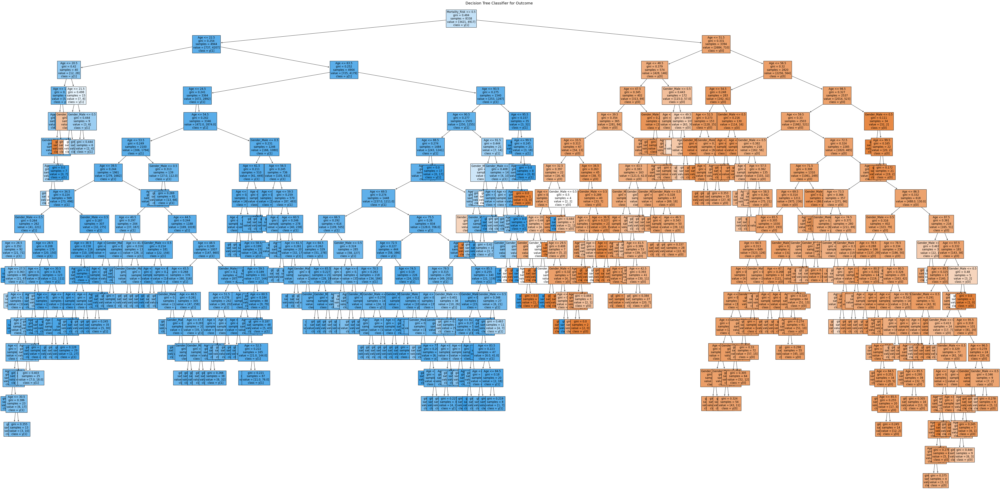

In [20]:
plt.figure(figsize=(80,40))
plot_tree(outcome_classifier, filled=True, feature_names=X_outcome.columns, class_names=True,  fontsize=12)
# proportion=True,  # Adjust the proportion of the plot
#           rounded=True
plt.title("Decision Tree Classifier for Outcome")
plt.show()

In [21]:
# from sklearn.tree import export_graphviz
# import graphviz

# dot_data = export_graphviz(outcome_classifier,
#                            out_file=None,
#                            feature_names=X_outcome.columns,
#                            class_names=True,
#                            filled=True,
#                            rounded=True,
#                            special_characters=True)
# graph = graphviz.Source(dot_data)
# graph.render("decision_tree")  # Save the plot as a file
# graph.view()  # Display the plot

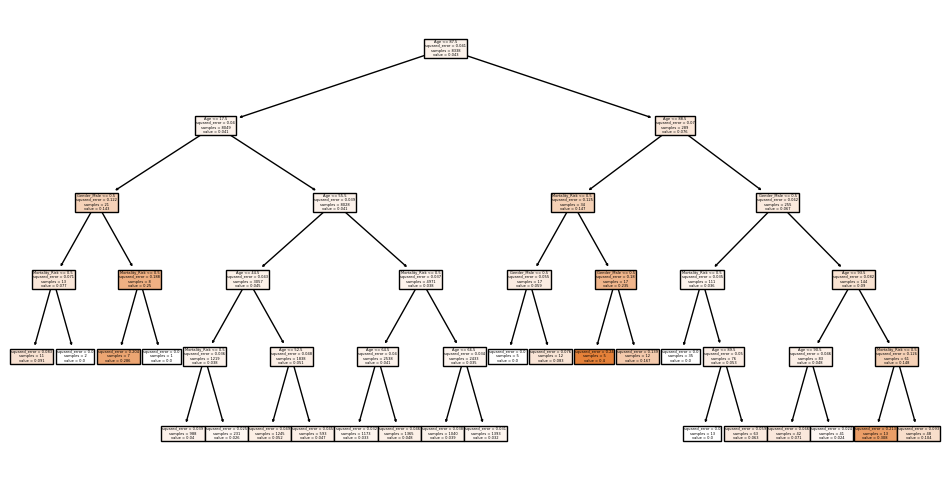

In [22]:
plt.figure(figsize=(12, 6))
plot_tree(outcome_regressor, feature_names=X_outcome.columns, filled=True, class_names=True)
plt.show()

In [23]:
# !pip install pycaret

In [24]:
from pycaret.regression import *

reg = setup(df, target='Length of Stay', fold = 5)
best_model = compare_models()

,Description,Value
0,Session id,1770
1,Target,Length of Stay
2,Target type,Regression
3,Original data shape,"(10423, 79)"
4,Transformed data shape,"(10423, 97)"
5,Transformed train set shape,"(7296, 97)"
6,Transformed test set shape,"(3127, 97)"
7,Numeric features,19
8,Date features,2
9,Categorical features,5


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
lr,Linear Regression,0.1890,0.1025,0.3201,0.9915,0.0582,0.0518,2.1340
br,Bayesian Ridge,0.1893,0.1026,0.3202,0.9915,0.0582,0.0520,0.1980
knn,K Neighbors Regressor,1.1819,2.9815,1.7139,0.7568,0.2946,0.3728,0.2160
lightgbm,Light Gradient Boosting Machine,1.2107,4.1093,2.0218,0.6627,0.3064,0.3696,0.2260
ridge,Ridge Regression,2.2894,8.8909,2.9802,0.2678,0.4942,0.7590,0.1220
gbr,Gradient Boosting Regressor,2.3158,9.5477,3.0867,0.2135,0.5047,0.7678,0.5120
en,Elastic Net,2.6687,12.1449,3.4835,-0.0005,0.5722,0.9389,0.1220
llar,Lasso Least Angle Regression,2.6692,12.1477,3.4839,-0.0008,0.5722,0.9391,0.1080
dummy,Dummy Regressor,2.6693,12.1478,3.4839,-0.0008,0.5723,0.9392,0.0960
lasso,Lasso Regression,2.6692,12.1477,3.4839,-0.0008,0.5722,0.9391,1.4700


,Description,Value
0,Session id,2732
1,Target,Length of Stay
2,Target type,Regression
3,Original data shape,"(10423, 79)"
4,Transformed data shape,"(10423, 97)"
5,Transformed train set shape,"(7296, 97)"
6,Transformed test set shape,"(3127, 97)"
7,Numeric features,19
8,Date features,2
9,Categorical features,5


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
lr,Linear Regression,0.1901,0.1055,0.3245,0.9915,0.0594,0.0526,0.2560
br,Bayesian Ridge,0.1902,0.1055,0.3245,0.9915,0.0594,0.0527,0.2000
knn,K Neighbors Regressor,1.1912,2.9957,1.7281,0.7590,0.2984,0.3816,0.1940
lightgbm,Light Gradient Boosting Machine,1.1691,3.9867,1.9895,0.6809,0.2953,0.3470,0.4500
ridge,Ridge Regression,2.3128,9.0921,3.0140,0.2692,0.5001,0.7770,0.1280
gbr,Gradient Boosting Regressor,2.2560,9.1962,3.0264,0.2622,0.4951,0.7537,0.6200
omp,Orthogonal Matching Pursuit,1.9462,10.2515,2.6232,0.1981,0.4152,0.6344,0.1320
rf,Random Forest Regressor,2.5069,12.0546,3.4684,0.0325,0.5557,0.8096,2.0760
llar,Lasso Least Angle Regression,2.6978,12.4445,3.5267,-0.0008,0.5806,0.9656,0.1560
lasso,Lasso Regression,2.6978,12.4445,3.5267,-0.0008,0.5806,0.9656,0.1980


The selected model does not have feature importances. Let's try a different model.


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,3.2034,20.1445,4.4883,-0.6536,0.7302,1.0742
1,2.7217,16.7313,4.0904,-0.4388,0.6503,0.7714
2,2.9164,19.0302,4.3624,-0.4427,0.6925,0.8544
3,3.1535,19.8211,4.4521,-0.5275,0.7059,0.8883
4,2.9020,17.9232,4.2336,-0.4694,0.6888,0.8851
Mean,2.9794,18.7301,4.3253,-0.5064,0.6936,0.8947
Std,0.1771,1.2591,0.1467,0.0801,0.0260,0.0992


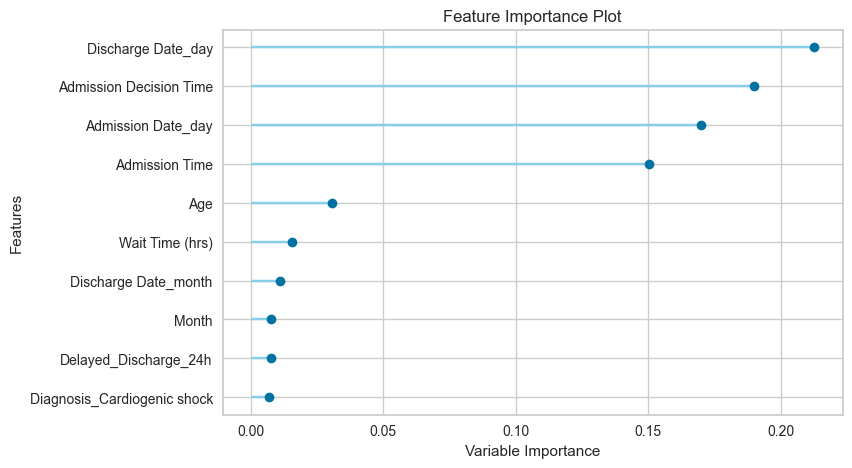

In [25]:
reg = setup(data=df, target='Length of Stay', fold=5)

best_model = compare_models()

if hasattr(best_model, 'feature_importances_'):
    plot_model(best_model, plot='feature')
else:
    print("The selected model does not have feature importances. Let's try a different model.")
    dt_model = create_model('dt')
    plot_model(dt_model, plot='feature')

In [26]:
from pycaret.classification import *
clf = setup(df, target='Survived', fold = 5)

selected_features = get_config('X').columns
print("Selected Features:", selected_features)

,Description,Value
0,Session id,7148
1,Target,Survived
2,Target type,Binary
3,Original data shape,"(10423, 79)"
4,Transformed data shape,"(10423, 97)"
5,Transformed train set shape,"(7296, 97)"
6,Transformed test set shape,"(3127, 97)"
7,Numeric features,19
8,Date features,2
9,Categorical features,5


Selected Features: Index(['Admission Date', 'Admission Decision Time', 'Admission Time',
       'Discharge Date', 'Length of Stay', 'Cardiovascular Support',
       'Dialysis Support', 'Invasive Ventilation', 'Nutrition', 'Age',
       'Unplanned_Readmission_48h', 'Unplanned_Discharge_Night',
       'High_Risk_Sepsis', 'Unit_Acquired_Infection',
       'Organ_Donation_Potential', 'ICU_Transfer', 'Delayed_Discharge_8h',
       'Delayed_Discharge_24h', 'Mortality_Risk', 'COVID_Severity',
       'COVID_Status', 'Admission Hospital_Beaumont',
       'Admission Hospital_Cavan', 'Admission Hospital_Connolly',
       'Admission Hospital_Cork', 'Admission Hospital_Cork Mercy',
       'Admission Hospital_Galway', 'Admission Hospital_Letterkenny',
       'Admission Hospital_Limerick', 'Admission Hospital_Mater Misericordiae',
       'Admission Hospital_Mullingar', 'Admission Hospital_Naas',
       'Admission Hospital_Our Lady Drogheda', 'Admission Hospital_Sligo',
       'Admission Hospital_St J

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lr,Logistic Regression,0.8202,0.8280,0.8620,0.8376,0.8496,0.6262,0.6266,1.0520
ridge,Ridge Classifier,0.7715,0.8125,0.8255,0.7947,0.8097,0.5240,0.5248,0.1200
lda,Linear Discriminant Analysis,0.7577,0.8042,0.8148,0.7828,0.7984,0.4950,0.4958,0.2000
et,Extra Trees Classifier,0.7534,0.7999,0.8243,0.7725,0.7975,0.4831,0.4849,0.4700
rf,Random Forest Classifier,0.7027,0.7583,0.7994,0.7245,0.7600,0.3718,0.3751,0.3900
ada,Ada Boost Classifier,0.6909,0.6644,0.7778,0.7203,0.7478,0.3502,0.3521,0.3580
lightgbm,Light Gradient Boosting Machine,0.6857,0.6769,0.7680,0.7181,0.7422,0.3409,0.3423,0.3080
gbc,Gradient Boosting Classifier,0.6849,0.6798,0.7710,0.7161,0.7424,0.3381,0.3399,0.5460
nb,Naive Bayes,0.6705,0.7163,0.6999,0.7299,0.7144,0.3254,0.3261,0.1440
dt,Decision Tree Classifier,0.6353,0.6196,0.7075,0.6841,0.6955,0.2411,0.2414,0.1400


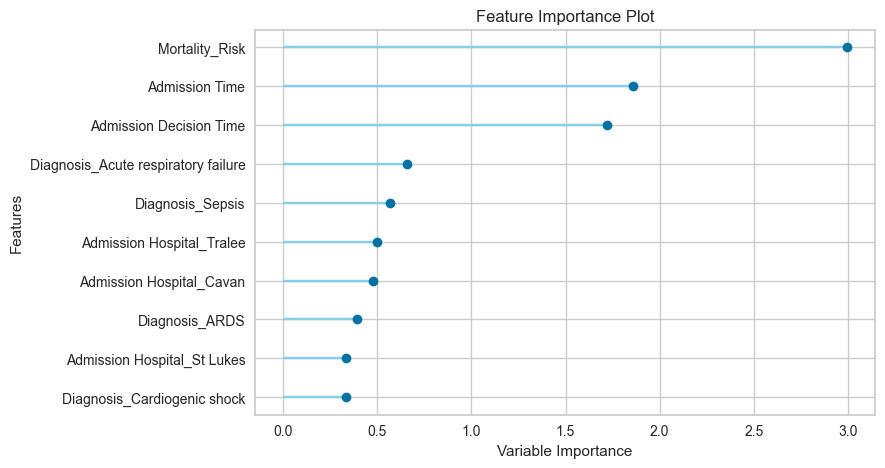

The selected model does not have feature importances. Let's try a decision tree.


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6240,0.6108,0.6849,0.6794,0.6821,0.2219,0.2220
1,0.6292,0.6117,0.7101,0.6763,0.6928,0.2259,0.2263
2,0.6244,0.6102,0.6903,0.6777,0.6840,0.2212,0.2213
3,0.6539,0.6355,0.7384,0.6940,0.7155,0.2748,0.2756
4,0.6450,0.6299,0.7140,0.6930,0.7033,0.2616,0.2618
Mean,0.6353,0.6196,0.7075,0.6841,0.6955,0.2411,0.2414
Std,0.0120,0.0108,0.0190,0.0078,0.0125,0.0226,0.0228


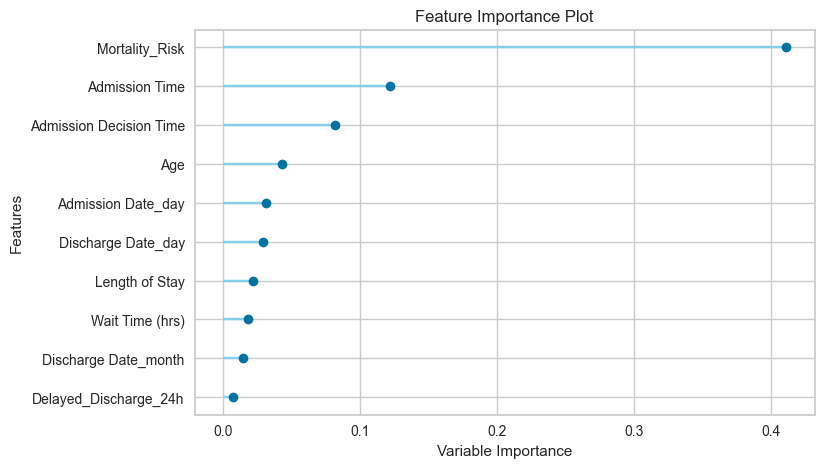

In [27]:
best_model = compare_models()
plot_model(best_model, plot='feature')
if hasattr(best_model, 'feature_importances_'):
    plot_model(best_model, plot='feature')
else:
    print("The selected model does not have feature importances. Let's try a decision tree.")
    dt_model = create_model('dt')
    plot_model(dt_model, plot='feature')

In [28]:
clf = setup(df, target='Survived', fold = 5)
best_model = compare_models()

,Description,Value
0,Session id,7939
1,Target,Survived
2,Target type,Binary
3,Original data shape,"(10423, 79)"
4,Transformed data shape,"(10423, 97)"
5,Transformed train set shape,"(7296, 97)"
6,Transformed test set shape,"(3127, 97)"
7,Numeric features,19
8,Date features,2
9,Categorical features,5


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lr,Logistic Regression,0.8240,0.8275,0.8574,0.8462,0.8516,0.6354,0.6358,0.9280
ridge,Ridge Classifier,0.7715,0.8117,0.8290,0.7927,0.8103,0.5234,0.5245,0.1060
lda,Linear Discriminant Analysis,0.7586,0.8035,0.8162,0.7832,0.7993,0.4969,0.4978,0.2240
et,Extra Trees Classifier,0.7541,0.7998,0.8295,0.7706,0.7989,0.4836,0.4860,0.4520
rf,Random Forest Classifier,0.7074,0.7570,0.8048,0.7274,0.7641,0.3814,0.3849,0.4080
ada,Ada Boost Classifier,0.6900,0.6600,0.7704,0.7220,0.7453,0.3502,0.3515,0.3200
lightgbm,Light Gradient Boosting Machine,0.6850,0.6730,0.7704,0.7163,0.7423,0.3387,0.3402,0.2800
gbc,Gradient Boosting Classifier,0.6815,0.6748,0.7634,0.7153,0.7385,0.3322,0.3336,0.5380
nb,Naive Bayes,0.6672,0.7084,0.6812,0.7344,0.7067,0.3234,0.3248,0.1220
qda,Quadratic Discriminant Analysis,0.6350,0.6516,0.7161,0.6864,0.6959,0.2357,0.2428,0.1360


In [29]:
dt_model = create_model('dt', max_depth=5)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6925,0.6286,0.7826,0.7198,0.7499,0.3526,0.3546
1,0.7025,0.6871,0.7605,0.7415,0.7509,0.3820,0.3821
2,0.6881,0.6322,0.7174,0.7443,0.7306,0.3607,0.3610
3,0.6827,0.6126,0.7485,0.7225,0.7353,0.3395,0.3399
4,0.7142,0.6687,0.7951,0.7392,0.7661,0.4000,0.4017
Mean,0.6960,0.6458,0.7608,0.7334,0.7465,0.3669,0.3679
Std,0.0112,0.0276,0.0271,0.0102,0.0126,0.0215,0.0217


In [30]:
dt_model = create_model('dt')
tuned_dt = tune_model(dt_model, custom_grid={"max_depth": [3, 5]}, optimize='Accuracy')
# predictions = predict_model(tuned_dt, data=future_df)
# future_predictions_dt = predict_model(tuned_dt, fh=30, return_pred_int=True)

# print(future_predictions_dt)


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6199,0.6025,0.7000,0.6696,0.6845,0.2070,0.2074
1,0.6477,0.6338,0.7116,0.6970,0.7043,0.2688,0.2689
2,0.6347,0.6210,0.6977,0.6873,0.6924,0.2427,0.2428
3,0.6230,0.6047,0.7078,0.6703,0.6886,0.2120,0.2125
4,0.6319,0.6133,0.7183,0.6765,0.6968,0.2297,0.2303
Mean,0.6314,0.6151,0.7071,0.6802,0.6933,0.2320,0.2324
Std,0.0098,0.0114,0.0076,0.0105,0.0068,0.0223,0.0222


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6644,0.7555,0.6988,0.7224,0.7104,0.3116,0.3119
1,0.7190,0.7352,0.8198,0.7344,0.7747,0.4043,0.4086
2,0.7108,0.6574,0.8349,0.7194,0.7729,0.3807,0.3888
3,0.7025,0.6799,0.8277,0.7131,0.7662,0.3636,0.3713
4,0.7252,0.7115,0.8452,0.7304,0.7836,0.4125,0.4208
Mean,0.7044,0.7079,0.8053,0.7239,0.7616,0.3746,0.3803
Std,0.0214,0.0357,0.0539,0.0076,0.0262,0.0359,0.0382


Fitting 5 folds for each of 2 candidates, totalling 10 fits


In [31]:
lr_model = create_model('lr')

In [32]:
import pandas as pd
from pycaret.time_series import *

df = df.sort_values(by='Admission Date')

df.set_index('Admission Date', inplace=True)

df_daily = df.resample('D').size() 


df_daily = df_daily.to_frame(name='ICU_Admissions')
print(df_daily.head())  # Check column names
print(df_daily.columns)  # Verify column names



ts_setup = setup(
    data=df_daily,
    target='ICU_Admissions', 
    fold_strategy='expanding',
    session_id=123,
    seasonal_period=7,  # Forces seasonal check
    transform_target='box-cox'
)
# 'D' (Daily)

# 'W' (Weekly)

# 'M' (Monthly)

# 'Q' (Quarterly)

# 'Y' (Yearly)



print(ts_setup)

best_model = compare_models()
print(best_model.get_params())

                ICU_Admissions
Admission Date                
2022-01-01                  27
2022-01-02                  22
2022-01-03                  28
2022-01-04                  26
2022-01-05                  28
Index(['ICU_Admissions'], dtype='object')


,Description,Value
0,session_id,123
1,Target,ICU_Admissions
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(365, 1)"
5,Transformed data shape,"(365, 1)"
6,Transformed train set shape,"(364, 1)"
7,Transformed test set shape,"(1, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,Model,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,TT (Sec)
auto_arima,Auto ARIMA,0.1526,0.1224,0.8890,0.8890,0.0311,0.0311,0.9933
arima,ARIMA,0.1860,0.1493,1.0839,1.0839,0.0379,0.0380,0.1233
theta,Theta Forecaster,0.2052,0.1647,1.1955,1.1955,0.0419,0.0419,0.0567
grand_means,Grand Means Forecaster,0.2071,0.1662,1.2067,1.2067,0.0422,0.0423,0.6200
huber_cds_dt,Huber w/ Cond. Deseasonalize & Detrending,0.2135,0.1713,1.2437,1.2437,0.0427,0.0436,0.0733
ridge_cds_dt,Ridge w/ Cond. Deseasonalize & Detrending,0.2177,0.1747,1.2683,1.2683,0.0436,0.0445,0.3333
omp_cds_dt,Orthogonal Matching Pursuit w/ Cond. Deseasonalize & Detrending,0.2177,0.1747,1.2682,1.2682,0.0436,0.0445,0.0833
lr_cds_dt,Linear w/ Cond. Deseasonalize & Detrending,0.2177,0.1747,1.2682,1.2682,0.0436,0.0445,0.2500
ada_cds_dt,AdaBoost w/ Cond. Deseasonalize & Detrending,0.2235,0.1793,1.3017,1.3017,0.0441,0.0456,0.0867
br_cds_dt,Bayesian Ridge w/ Cond. Deseasonalize & Detrending,0.2283,0.1832,1.3298,1.3298,0.0458,0.0467,0.0767


{'D': None, 'alpha': 0.05, 'concentrate_scale': False, 'd': None, 'enforce_invertibility': True, 'enforce_stationarity': True, 'error_action': 'warn', 'hamilton_representation': False, 'information_criterion': 'aic', 'max_D': 1, 'max_P': 2, 'max_Q': 2, 'max_d': 2, 'max_order': 5, 'max_p': 5, 'max_q': 5, 'maxiter': 50, 'measurement_error': False, 'method': 'lbfgs', 'mle_regression': True, 'n_fits': 10, 'n_jobs': 1, 'offset_test_args': None, 'out_of_sample_size': 0, 'random': False, 'random_state': 123, 'scoring': 'mse', 'scoring_args': None, 'seasonal': True, 'seasonal_test': 'ocsb', 'seasonal_test_args': None, 'simple_differencing': False, 'sp': 1, 'start_P': 1, 'start_Q': 1, 'start_p': 2, 'start_params': None, 'start_q': 2, 'stationary': False, 'stepwise': True, 'suppress_warnings': True, 'test': 'kpss', 'time_varying_regression': False, 'trace': False, 'trend': None, 'update_pdq': True, 'with_intercept': True}


In [ ]:
# evaluate_model(best_model)

# tuned_model = tune_model(best_model)
# future_predictions = predict_model(best_model, fh=30, return_pred_int=True)

# print(future_predictions)

best_model = compare_models()
plot_model(best_model, plot='forecast')
tuned_model = tune_model(best_model)

future_predictions = predict_model(tuned_model, fh=30, return_pred_int=True)

print(future_predictions)



,Model,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,TT (Sec)
auto_arima,Auto ARIMA,0.1526,0.1224,0.8890,0.8890,0.0311,0.0311,0.9367
arima,ARIMA,0.1860,0.1493,1.0839,1.0839,0.0379,0.0380,0.0800
theta,Theta Forecaster,0.2052,0.1647,1.1955,1.1955,0.0419,0.0419,0.0600
grand_means,Grand Means Forecaster,0.2071,0.1662,1.2067,1.2067,0.0422,0.0423,0.0500
huber_cds_dt,Huber w/ Cond. Deseasonalize & Detrending,0.2135,0.1713,1.2437,1.2437,0.0427,0.0436,0.0867
ridge_cds_dt,Ridge w/ Cond. Deseasonalize & Detrending,0.2177,0.1747,1.2683,1.2683,0.0436,0.0445,0.0867
omp_cds_dt,Orthogonal Matching Pursuit w/ Cond. Deseasonalize & Detrending,0.2177,0.1747,1.2682,1.2682,0.0436,0.0445,0.0767
lr_cds_dt,Linear w/ Cond. Deseasonalize & Detrending,0.2177,0.1747,1.2682,1.2682,0.0436,0.0445,0.0700
ada_cds_dt,AdaBoost w/ Cond. Deseasonalize & Detrending,0.2235,0.1793,1.3017,1.3017,0.0441,0.0456,0.1067
br_cds_dt,Bayesian Ridge w/ Cond. Deseasonalize & Detrending,0.2283,0.1832,1.3298,1.3298,0.0458,0.0467,0.0833


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE
0,2022-12-27,0.2101,0.1686,1.2251,1.2251,0.0408,0.0417
1,2022-12-28,0.1825,0.1465,1.0633,1.0633,0.0394,0.0386
2,2022-12-29,0.0651,0.0522,0.3785,0.3785,0.0131,0.0131
Mean,NaT,0.1526,0.1224,0.8890,0.8890,0.0311,0.0311
SD,NaT,0.0629,0.0505,0.3670,0.3670,0.0128,0.0128


Fitting 3 folds for each of 1 candidates, totalling 3 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    3.1s finished


             y_pred    lower    upper
2022-12-31  28.2161  20.5402  36.6742
2023-01-01  28.4549  20.7412  36.9516
2023-01-02  28.3659  20.6258  36.8974
2023-01-03  28.3940  20.6506  36.9288
2023-01-04  28.3838  20.6411  36.9181
2023-01-05  28.3871  20.6441  36.9217
2023-01-06  28.3860  20.6430  36.9204
2023-01-07  28.3864  20.6434  36.9209
2023-01-08  28.3862  20.6432  36.9207
2023-01-09  28.3863  20.6433  36.9208
2023-01-10  28.3862  20.6433  36.9208
2023-01-11  28.3862  20.6433  36.9208
2023-01-12  28.3862  20.6433  36.9208
2023-01-13  28.3862  20.6433  36.9208
2023-01-14  28.3862  20.6433  36.9208
2023-01-15  28.3862  20.6433  36.9208
2023-01-16  28.3862  20.6433  36.9208
2023-01-17  28.3862  20.6433  36.9208
2023-01-18  28.3862  20.6433  36.9208
2023-01-19  28.3862  20.6433  36.9208
2023-01-20  28.3862  20.6433  36.9208
2023-01-21  28.3862  20.6433  36.9208
2023-01-22  28.3862  20.6433  36.9208
2023-01-23  28.3862  20.6433  36.9208
2023-01-24  28.3862  20.6433  36.9208
2023-01-25  

In [34]:
plot_model()
plot_model(plot='train_test_split')
plot_model(best_model, plot='forecast')

# plot_model(best_model, plot='forecast', display_format='plotly-widget')
# plot_model(best_model, plot='forecast', display_format='streamlit')
# plot_model(best_model, plot='forecast', display_format='plotly-dash')
# plot_model(best_model, plot='forecast')
# None, 'streamlit', 'plotly-dash', 'plotly-widget'

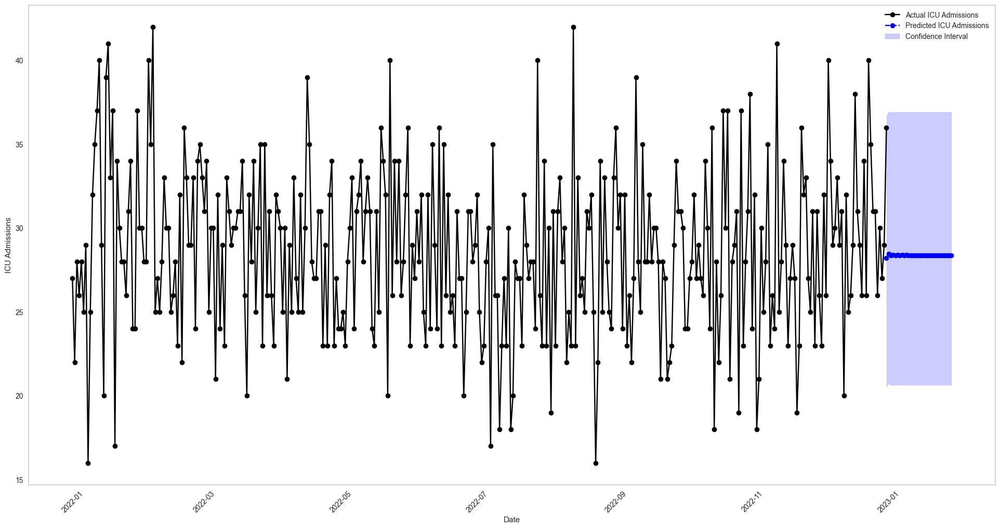

In [35]:
import matplotlib.pyplot as plt

plt.figure(figsize=(24, 12))
plt.plot(df_daily.index, df_daily['ICU_Admissions'], label='Actual ICU Admissions', color='black', marker='o')

plt.plot(future_predictions.index, future_predictions['y_pred'], label='Predicted ICU Admissions', color='blue', linestyle='dashed', marker='o')

plt.fill_between(
    future_predictions.index,
    future_predictions['lower'],
    future_predictions['upper'],
    color='blue',
    alpha=0.2,
    label='Confidence Interval'
)
plt.xlabel('Date')
plt.ylabel('ICU Admissions')
# plt.title
plt.legend()
plt.xticks(rotation=45)
plt.grid()

plt.show()
